In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
import os
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict

In [2]:
#Read file as weekly cases
cases = pd.read_csv('../assets/datagov/dengue-cases-count-weekly/weekly-number-of-dengue-and-dengue-haemorrhagic-fever-cases.csv')
#Read file as mss
meteo = pd.read_csv('../assets/mss/mss_data.csv')

### Look at meterological trends

In [3]:
#drop column 1
meteo=meteo.iloc[:,1:]

In [4]:
# Convert all columns to lowercase and replace spaces in column names.
meteo.columns = meteo.columns.str.lower().str.replace(' ', '_')

In [5]:
#drop all rows with missing year
meteo.drop(meteo[meteo['year'].isnull()].index, inplace = True)

In [6]:
#get week number
meteo['date']=pd.to_datetime(meteo[['year', 'month', 'day']])
meteo['eweek']=meteo['date'].dt.isocalendar().week

<AxesSubplot:title={'center':'Average weekly rainfall over the 52 weeks'}, xlabel='eweek'>

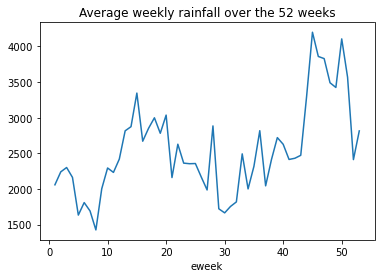

In [7]:
rainfall=meteo.groupby(by=["year","eweek"]).sum()
rainfall=rainfall.reset_index()
rainfall=rainfall[["year","eweek","daily_rainfall_total"]]
rainfall.rename(columns={"daily_rainfall_total":"rainfall_weekly_cum"},inplace=True)

rainfall_grp=rainfall.groupby(by="eweek").mean()['rainfall_weekly_cum']
rainfall_grp.plot(title="Average weekly rainfall over the 52 weeks")

It appears end of year has higher rainfall, as expected.

<AxesSubplot:title={'center':'Average weekly temperature over the 52 weeks'}, xlabel='eweek'>

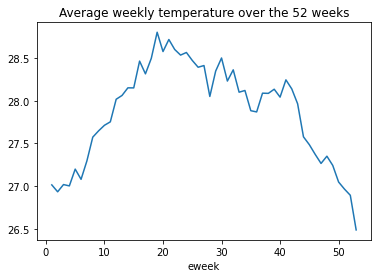

In [8]:
temp=meteo.groupby(by=["year","eweek"]).mean()
temp=temp.reset_index()
temp=temp[["year","eweek","mean_temperature"]]
temp.rename(columns={"mean_temperature":"temperature_weekly_avg"},inplace=True)

temp_grp=temp.groupby(by="eweek").mean()['temperature_weekly_avg']
temp_grp.plot(title="Average weekly temperature over the 52 weeks")

It appears middle of the year has higher temperature, as expected.

### Look at dengue case trends

In [9]:
cases = cases.loc[cases['type_dengue'] == "Dengue"]
cases.drop(columns={"type_dengue"},inplace=True,errors="ignore")
cases.rename(columns={'number':'dengue_case_count'},inplace=True)

<AxesSubplot:title={'center':'Average weekly dengue case count over the 52 weeks'}, xlabel='eweek'>

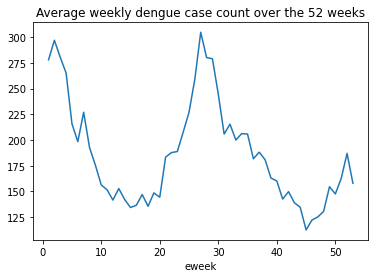

In [10]:
cases_grp=cases.groupby(by="eweek").mean()['dengue_case_count']
cases_grp.plot(title="Average weekly dengue case count over the 52 weeks")

We can see 2 peaks of Dengue cases, start and middle of year.

In [11]:
df_comb=pd.DataFrame([cases_grp,temp_grp,rainfall_grp]).T

Find best correlation lag period for temp and rainfall

lag for max temp: 12.0
lag for max rain: 17.0


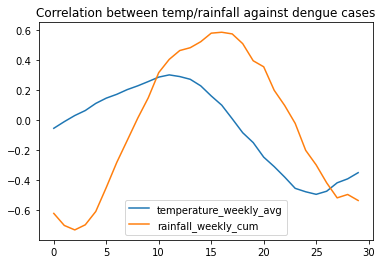

In [12]:
df_comb_test=df_comb.copy()
df_comb_test.reset_index(drop=True,inplace=True)
list_=[]
for shift in range(1,53):
    df_dengue_case_count = pd.concat([df_comb['dengue_case_count'].iloc[-shift:], df_comb['dengue_case_count'].iloc[:-shift]])
    df_dengue_case_count.reset_index(drop=True,inplace=True)
    
    df_comb_test['dengue_case_count']=df_dengue_case_count
    x=df_comb_test.corr()['dengue_case_count']
    x['shift']=shift
    list_.append(x.to_dict())
correlation_df=pd.DataFrame(list_)
correlation_df=correlation_df.iloc[0:30,:]
correlation_df['temperature_weekly_avg'].plot(legend="Temperature",title="Correlation between temp/rainfall against dengue cases")
correlation_df['rainfall_weekly_cum'].plot(legend="Rainfall")
correlation_df.set_index('shift',inplace=True)
# display(correlation_df)
correlation_df=correlation_df.iloc[0:30,:]
print("lag for max temp:", correlation_df['temperature_weekly_avg'].idxmax())
print("lag for max rain:", correlation_df['rainfall_weekly_cum'].idxmax())

### It appears temperature is most correlated at a lag of 12 weeks whereas rainfall at 17 weeks. 

In [13]:
normalizer = MinMaxScaler()

In [14]:
names=['dengue_case_count','temperature_weekly_avg','rainfall_weekly_cum']

for name in names:
    df_comb[name]=normalizer.fit_transform(df_comb[[name]])

<AxesSubplot:xlabel='eweek'>

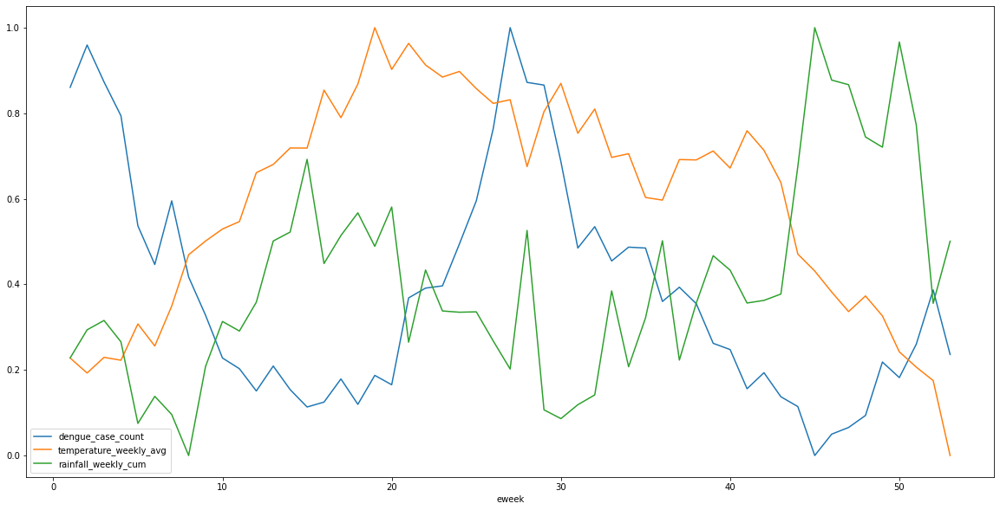

In [15]:
df_comb.plot(figsize=(20,10))


Very messy, so nothing much to say here.

### Look at geographical data

In [16]:
csv_files=[
    os.path.join(os.getcwd(),'../assets/outbreaks/merged_2015.csv'),
    os.path.join(os.getcwd(),'../assets/outbreaks/merged_2016.csv'),
    os.path.join(os.getcwd(),'../assets/outbreaks/merged_2017.csv'),
    os.path.join(os.getcwd(),'../assets/outbreaks/merged_2018.csv'),
    os.path.join(os.getcwd(),'../assets/outbreaks/merged_2019.csv'),
    os.path.join(os.getcwd(),'../assets/outbreaks/merged_2020.csv')    
]
df_g = pd.concat(
    map(pd.read_csv, csv_files), ignore_index=True)

In [17]:
xmin=df_g['long'].min()
xmax=df_g['long'].max()
ymin=df_g['lat'].min()
ymax=df_g['lat'].max()

In [18]:
df_g.drop(columns={"cluster_n","rec_cases_in_cluster","total_cases"},inplace=True,errors="ignore")
df_g['date']=pd.to_datetime(df_g['date'],format="%y%m%d")

In [19]:
df_grp=df_g.groupby(by=["lat","long","month_num"]).sum()
df_grp.reset_index(inplace=True,drop=False)
df_grp.sort_values("month_num",inplace=True)

### Animation by months in a year

In [20]:
color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df_grp, 
                        lat="lat", 
                        lon="long", 
                        animation_frame="month_num",
                        animation_group="n_of_cases",
                        hover_data=["n_of_cases"],
                        color="n_of_cases",
                        color_continuous_scale=color_scale,
                        range_color=[0,340],
                        size="n_of_cases",
                        zoom=10, 
                        height=500,
                        width=900)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Looks like a pile of mess.

### Let's try to split them into clusters

Let's plot the invididual cases without the background map and sizing

In [21]:
df_loc=df_grp.groupby(by=["lat","long","month_num"]).sum()
df_loc.reset_index(inplace=True,drop=False)

<AxesSubplot:xlabel='long', ylabel='lat'>

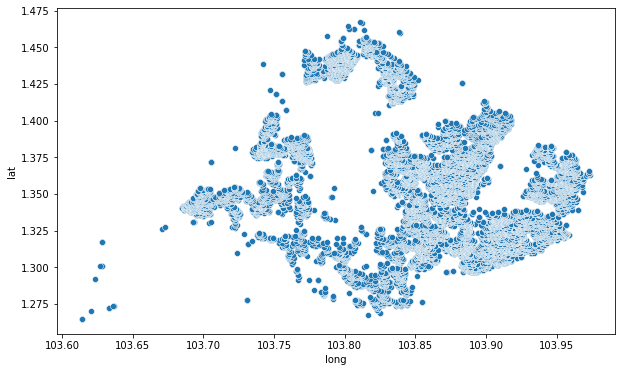

In [22]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', data=df_loc)

#### Try clustering kmeans

In [23]:
from sklearn import preprocessing, cluster
import numpy as np
import scipy

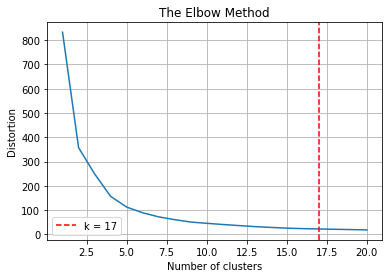

In [24]:
X = df_loc[["lat","long"]]
weights=df_loc['n_of_cases']
max_k = 20
## iterations
distortions = [] 
for i in range(1, max_k+1):
    if len(X) >= i:
       model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
       model.fit(X,sample_weight=weights)
       distortions.append(model.inertia_)
## best k: the lowest derivative
k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i 
     in np.diff(distortions,2)]))
## plot
fig, ax = plt.subplots()
ax.plot(range(1, len(distortions)+1), distortions)
ax.axvline(k, ls='--', color="red", label="k = "+str(k))
ax.set(title='The Elbow Method', xlabel='Number of clusters', 
       ylabel="Distortion")
ax.legend()
ax.grid(True)
plt.show()

C:\Users\Gary\AppData\Local\Temp\ipykernel_2644\809625312.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



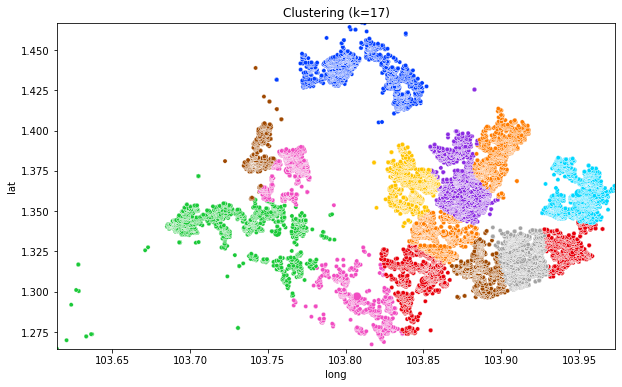

In [25]:
k = 17
model = cluster.KMeans(n_clusters=k, init='k-means++',random_state=42)
X = df_loc[["lat","long"]]
## clustering
df_loc_X = X.copy()
df_loc_X["cluster"] = model.fit_predict(X,sample_weight=weights)
## find real centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                     df_loc_X.drop("cluster", axis=1).values)
df_loc_X["centroids"] = 0
for i in closest:
    df_loc_X["centroids"].iloc[i] = 1

## plot
fig, ax = plt.subplots(figsize=(10,6))
sns.scatterplot(x="long", y="lat", data=df_loc_X, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend=False, ax=ax).set_title('Clustering (k='+str(k)+')')
plt.xlim([xmin,xmax])
plt.ylim([ymin,ymax])
th_centroids = model.cluster_centers_
ax.scatter(th_centroids[:,0], th_centroids[:,1], s=100, c='black', 
           marker="x")

Some of the clusters seems too huge, let's increase to k=19

C:\Users\Gary\AppData\Local\Temp\ipykernel_2644\1860394345.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



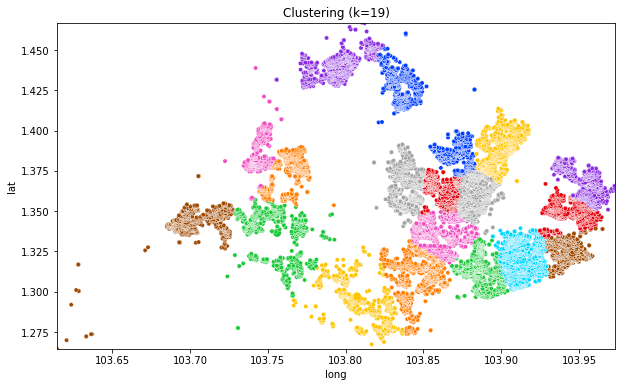

In [26]:
k = 19
model = cluster.KMeans(n_clusters=k, init='k-means++',random_state=42)
X = df_loc[["lat","long"]]
## clustering
df_loc_X = X.copy()
df_loc_X["cluster"] = model.fit_predict(X,sample_weight=weights)
## find real centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                     df_loc_X.drop("cluster", axis=1).values)
df_loc_X["centroids"] = 0
for i in closest:
    df_loc_X["centroids"].iloc[i] = 1

## plot
fig, ax = plt.subplots(figsize=(10,6))
sns.scatterplot(x="long", y="lat", data=df_loc_X, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend=False, ax=ax).set_title('Clustering (k='+str(k)+')')
plt.xlim([xmin,xmax])
plt.ylim([ymin,ymax])
th_centroids = model.cluster_centers_
ax.scatter(th_centroids[:,0], th_centroids[:,1], s=100, c='black', 
           marker="x")

Looks better. Let's keep to 19 clusters

In [27]:
#add cluster ID to lat/long pairs
df_merged=df_loc.merge(df_loc_X[["lat","long","cluster"]],on=["lat","long"])
df_merged.sort_values("month_num",inplace=True)

#groupby clusters for plotting on animation graph
df_merged_2=df_merged.groupby(by=["month_num","cluster"]).agg({'lat':'mean','long':'mean','n_of_cases':'sum'})
df_merged_2.reset_index(inplace=True,drop=False)

In [28]:
fig = px.scatter_mapbox(df_merged_2, 
                        lat="lat", 
                        lon="long", 
                        animation_frame="month_num",
                        animation_group="cluster",
                        hover_data=["n_of_cases"],
                        color="cluster",
                        color_continuous_scale=px.colors.sequential.Turbo,
                        size="n_of_cases",
                        zoom=10, 
                        height=500,
                        width=900)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(coloraxis_showscale=False)
fig.show()

### Check outbreaks.sg case trend by months

<AxesSubplot:xlabel='month_num'>

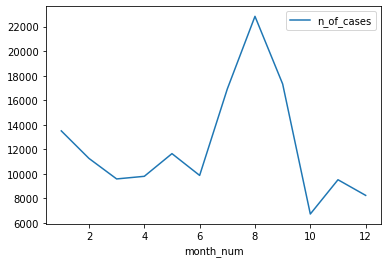

In [29]:
df_cg=df_g.groupby(by="month_num")[['n_of_cases']].sum()
df_cg.plot()

Somewhat same as data gov info that July/August has a major peak, whereas January has a minor peak

### Check outbreaks.sg case trend by month for each cluster

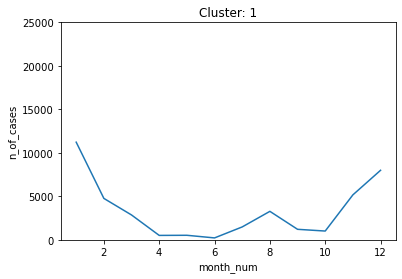

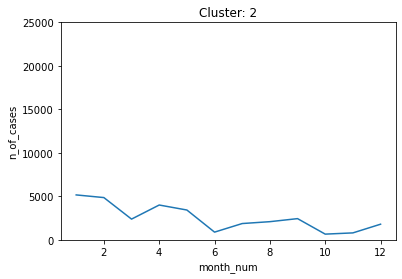

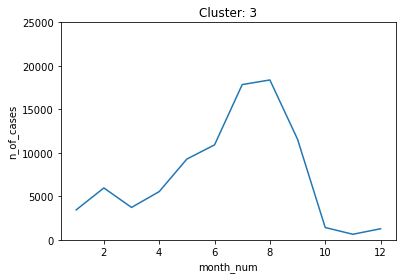

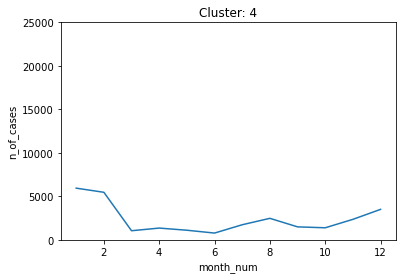

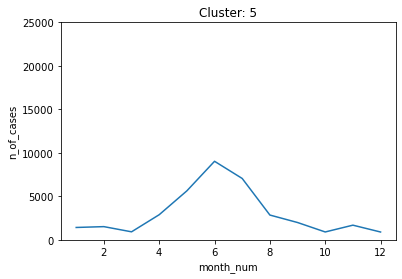

...

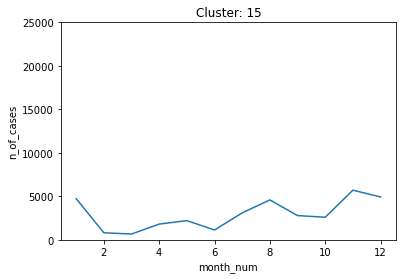

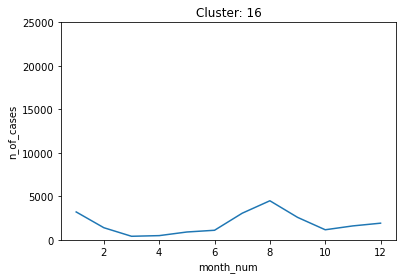

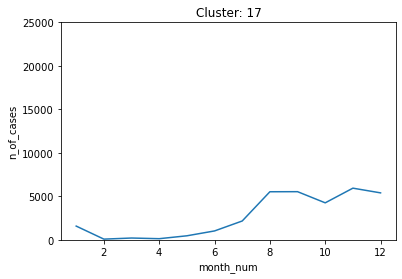

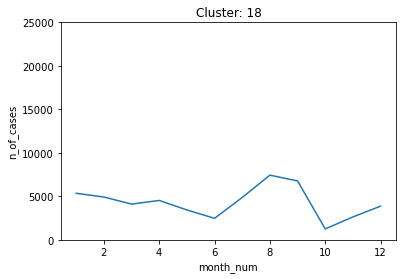

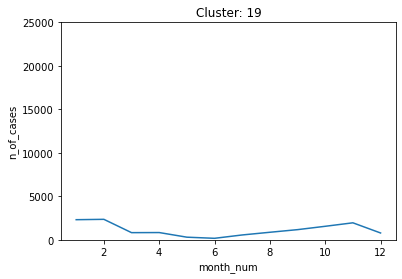

In [30]:
k=df_merged_2['cluster'].max()+1

for i in range(k):
    df_temp=df_merged_2[df_merged_2['cluster']==i]

#     df_temp.set_index('month_num',inplace=True)
#     display(df_temp)
#     df_temp['n_of_cases'].plot()
    plt.figure()
    g=sns.lineplot(data=df_temp,x='month_num',y='n_of_cases').set(title=f"Cluster: {i+1}")
    plt.ylim(0,25000)
    

So we see some clusters have midyear/start-of-year peak. Some have higher, some have mild peaks.  
Kind of suggest we can use this to selectively pick spatially.

#### Let's look at autocorrelation of the dengue case count itself.  
Let's look at ACF and PACF

In [31]:
cases.dropna(inplace=True)
cases.reset_index(inplace=True)

In [32]:
cases_d=cases['dengue_case_count']
# cases_test=cases.iloc[0:200,:]

C:\Users\Gary\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



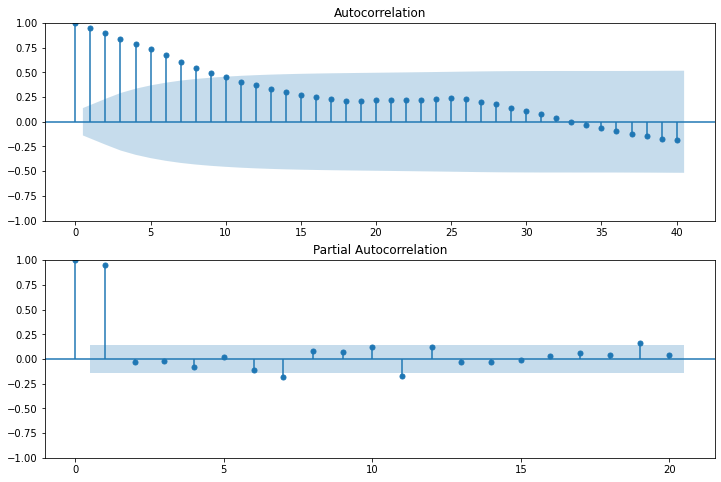

In [33]:
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(cases_d.iloc[0:200], lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(cases_d.iloc[0:200], lags=20, ax=ax2)

Okay no idea how to interprety these what these mean.  
We'll leave this here.

---

We built a simple linear regression model $V=\alpha Temp_{k}+(1-\alpha)Rainfall_{j}$  
where $k$ is the temperature lag value of 12 and $j$ is the rainfall lag value of 17.
We iterate through different $\alpha$ values to determing which gives the best fit.

In [34]:
pd.set_option('display.max_rows',None)

In [35]:
df=cases.sort_values(by=["year","eweek"])
df.reset_index(drop=True,inplace=True)
df.dropna(inplace=True)

In [36]:
df=df.merge(rainfall,on=["year","eweek"],how="left")
df=df.merge(temp,on=["year","eweek"],how="left")

In [37]:
df['rainfall_weekly_cum']=df['rainfall_weekly_cum'].shift(periods=17)
df['temperature_weekly_avg']=df['temperature_weekly_avg'].shift(periods=12)
df.dropna(inplace=True)

In [38]:
alphas=np.arange(0,1,0.3)

In [39]:
from sklearn import preprocessing
mms=preprocessing.MinMaxScaler()

In [40]:
def generate_graph_1(d,alpha):
    d['rainfall_weekly_cum']=mms.fit_transform(d[['rainfall_weekly_cum']])
    d['temperature_weekly_avg']=mms.fit_transform(d[['temperature_weekly_avg']])
    d['predict']=alpha*d['temperature_weekly_avg']+(1-alpha)*d['rainfall_weekly_cum']
    d['predict']=mms.fit_transform(d[['predict']])
    d['dengue_case_count']=mms.fit_transform(d[['dengue_case_count']])
    d['SMA5']=d['predict'].rolling(5).mean()
    d['SMA10']=d['predict'].rolling(10).mean()
    d['SMA15']=d['predict'].rolling(15).mean().shift(periods=-15)
    d.plot(figsize=(10,7),y=['dengue_case_count','SMA15'],title=f"Alpha: {alpha}")
    plt.axhline(y = 0.42, color = 'r', linestyle = '-')

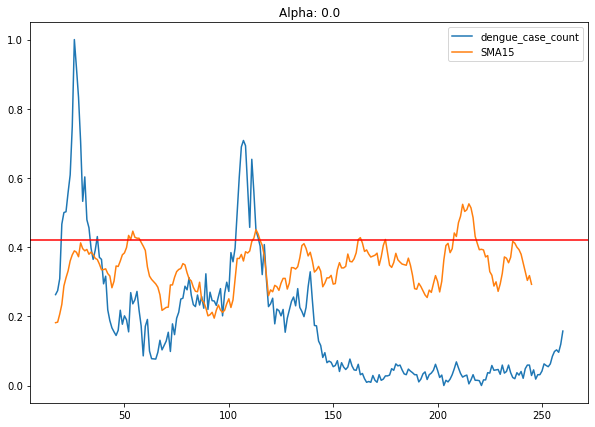

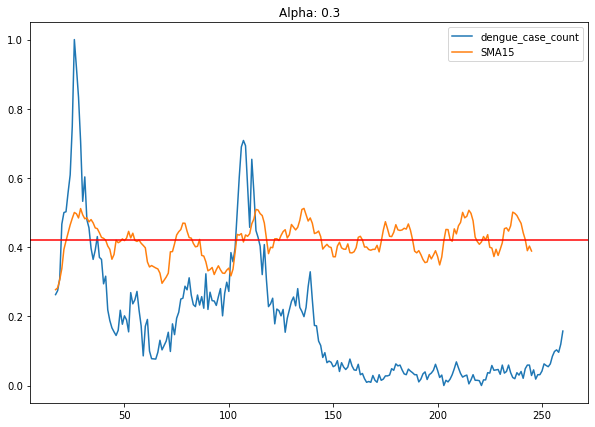

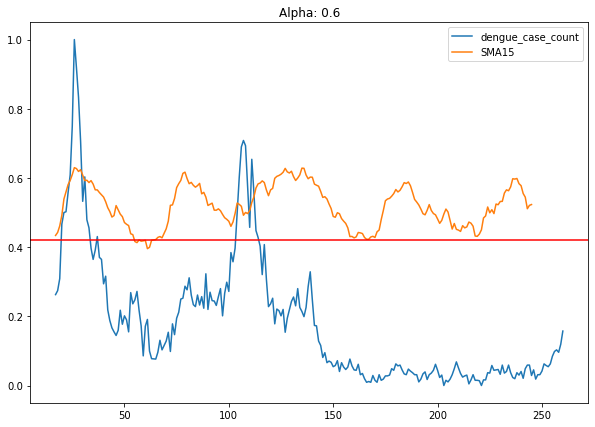

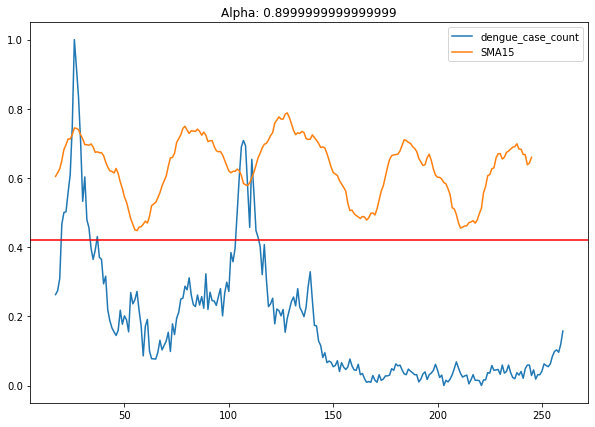

In [41]:
for alpha in alphas:
    generate_graph_1(df,alpha)

Interesting, but need to set arbitraty cut off.

Introduce concept of Moving Average Crossover  
$MAC = SMA_{slow} - SMA_{fast}$

In [42]:
def generate_graph_2(d,alpha):
    d['rainfall_weekly_cum']=mms.fit_transform(d[['rainfall_weekly_cum']])
    d['temperature_weekly_avg']=mms.fit_transform(d[['temperature_weekly_avg']])
    d['predict']=alpha*d['temperature_weekly_avg']+(1-alpha)*d['rainfall_weekly_cum']
    d['predict']=mms.fit_transform(d[['predict']])
    d['dengue_case_count']=mms.fit_transform(d[['dengue_case_count']])
    d['SMA5']=d['predict'].rolling(5).mean()
    d['SMA10']=d['predict'].rolling(10).mean()
    d['SMA15']=d['predict'].rolling(15).mean().shift(periods=-15)
    d.plot(figsize=(10,7),y=['dengue_case_count','SMA15'],title=f"Alpha: {alpha}")
    plt.axhline(y = 0.42, color = 'r', linestyle = '-')

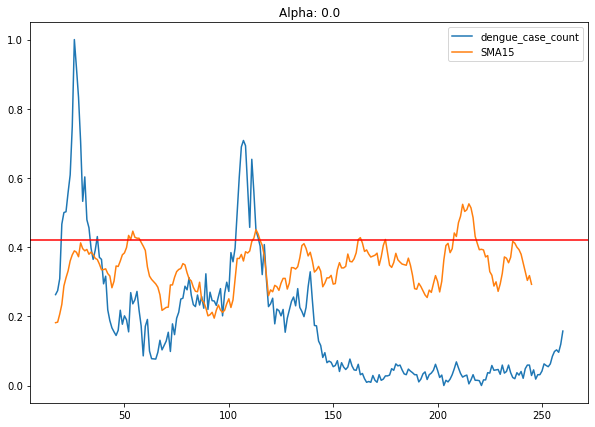

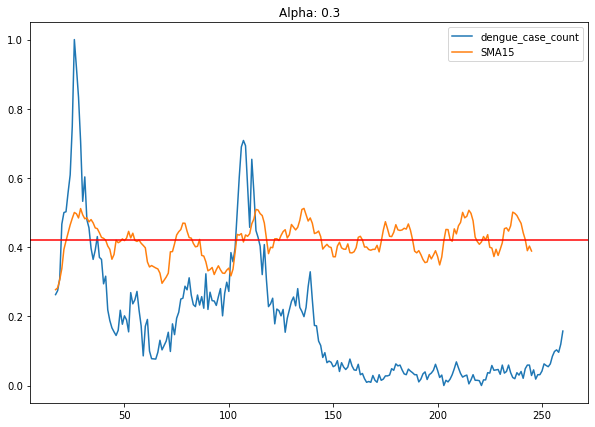

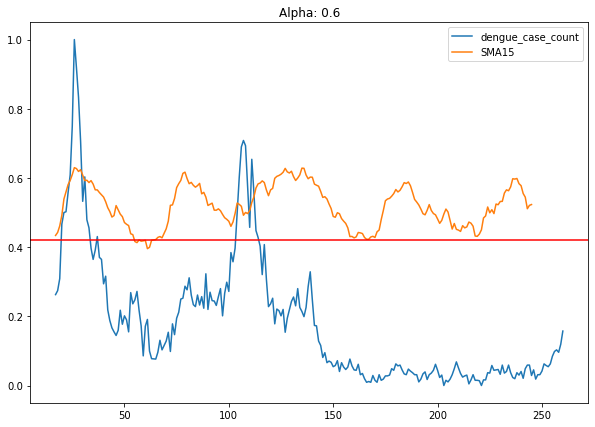

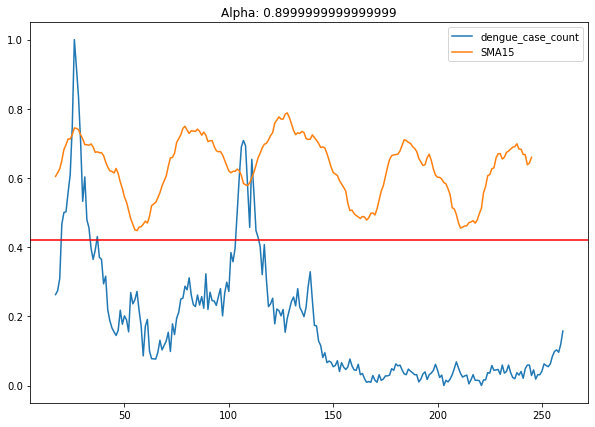

In [43]:
for alpha in alphas:
    generate_graph_2(df,alpha)

It is now more definite, if MAC is above 0, then take it as positive signal.